## [Chapter 8](https://ccrma.stanford.edu/~jos/pasp/Transfer_Function_Models.html)
# Transfer Function Models

## Frequency-Response Matching Using Digital Filter Design Methods


### Ideal Differentiator (Spring Admittance)

Given force inputs and velocity outputs, the frequency response for a spring was given in [chapter 7](https://ccrma.stanford.edu/~jos/pasp/Ideal_Spring.html) as

$\Gamma_k(j\omega) = \dfrac{j\omega}{k}$.

An ideal spring is thus a _differentiator_, since the ideal spring differentiates the applied force (divided by $ k$) to produce the output velocity. 

### Digital Differentiator Design

In [1]:
import sys
sys.path.append('./dsptools')
sys.path.append('../')

from PlotUtils import zplane
from dsptools import invfreqz, tfminphase
from scipy.signal import freqz
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 4)

In [2]:
def plot_digital_ideal_differentiator_est(num_zeros=10, num_poles=0, minumum_phase=False,
                                          fs=48_000, f_max=20_000):
    half_fs = fs // 2
    w = np.linspace(0, np.pi, half_fs)
    h = 1j * w # ideal differentiator frequency response

    b,a = invfreqz(h=h, w=w, nb=num_zeros, na=num_poles,
                   wt=np.concatenate([np.ones(f_max), np.zeros(half_fs - f_max)]), real=True)
    if minumum_phase:
        b,a = tfminphase(b,a)

    fig, [amplitude_response_plot, phase_plot, pz_plot] = plt.subplots(3, 1, figsize=(12, 12))
    w_est, h_est = freqz(b, a, worN=half_fs)

    x = fs * w / (2 * np.pi)

    fig.suptitle('Digital estimate of ideal differentiator frequency response', size=16)
    amplitude_response_plot.set_title('Amplitude response')
    amplitude_response_plot.plot(x, np.abs(h), label='$H(e^{j\\omega})=j\\omega$')
    amplitude_response_plot.plot(x, np.abs(h_est), label='$H_{est}$')
    amplitude_response_plot.axvline(f_max, c='black', label='$f_{max}$')
    amplitude_response_plot.set_xlim(0, half_fs)
    amplitude_response_plot.set_xlabel('Frequency (Hz)')
    amplitude_response_plot.set_ylabel('Amplitude')
    phase_plot.set_title('Phase response plot')
    phase_plot.plot(x, np.angle(h), label='$\\Theta(e^{j\\omega})$')
    phase_plot.plot(x, np.angle(h_est), label='$\\Theta_{est}$')
    phase_plot.set_xlim(0, half_fs)
    phase_plot.set_xlabel('Frequency (Hz)')
    phase_plot.set_ylabel('Phase (rad)')
    amplitude_response_plot.legend(loc='upper left')
    phase_plot.legend(loc='upper left')

    pz_plot.set_title('Poles & Zeros')
    zplane(b, a, fig=fig, ax=pz_plot)
    fig.tight_layout()
    fig.subplots_adjust(top=0.90)

    return b, a

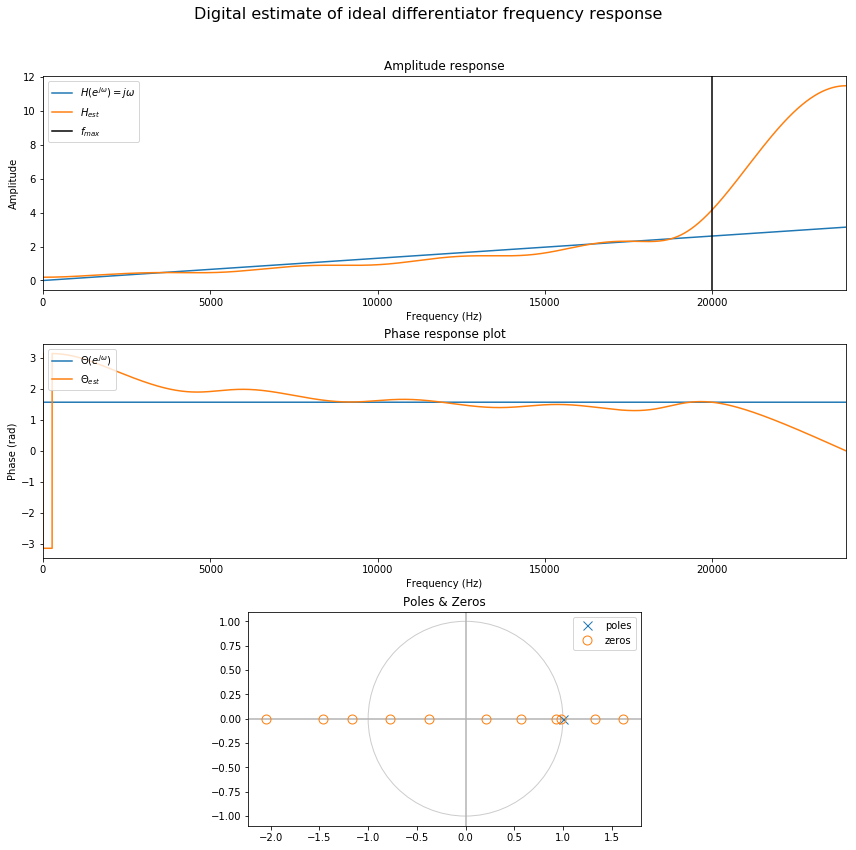

In [3]:
_ = plot_digital_ideal_differentiator_est()

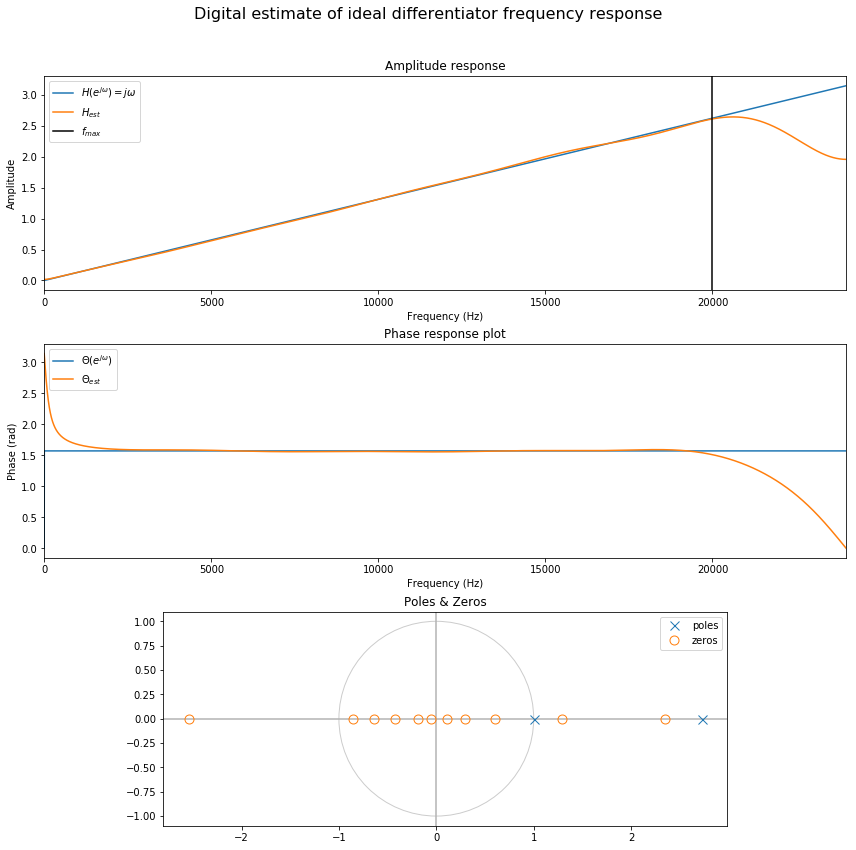

In [4]:
_ = plot_digital_ideal_differentiator_est(num_zeros=10, num_poles=1)

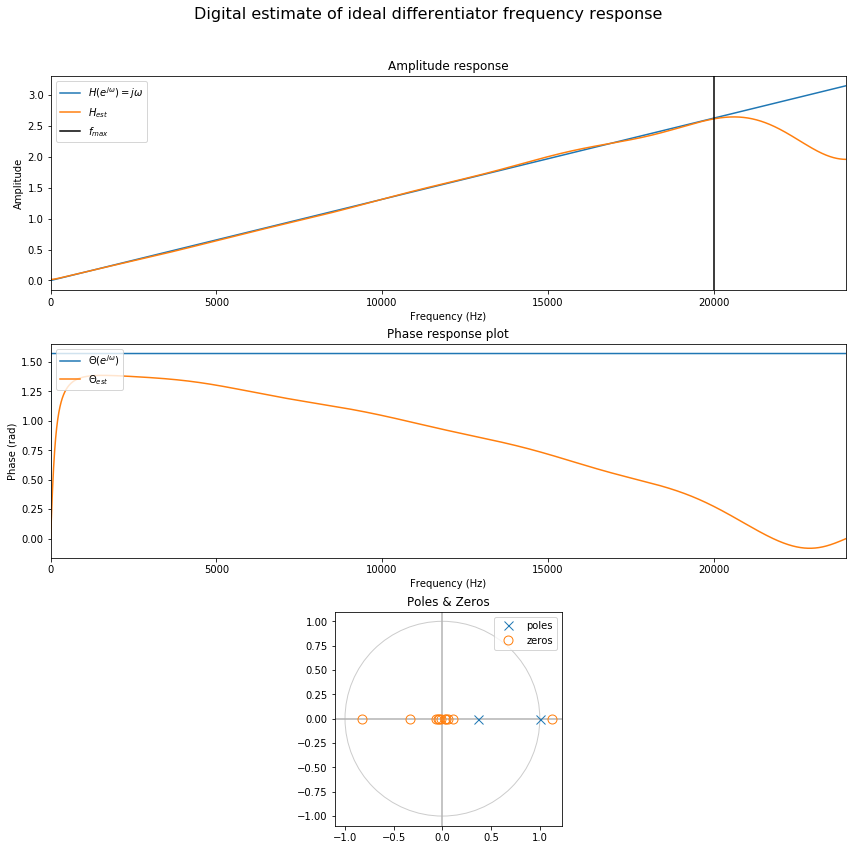

In [5]:
_ = plot_digital_ideal_differentiator_est(num_zeros=10, num_poles=1, minumum_phase=True)

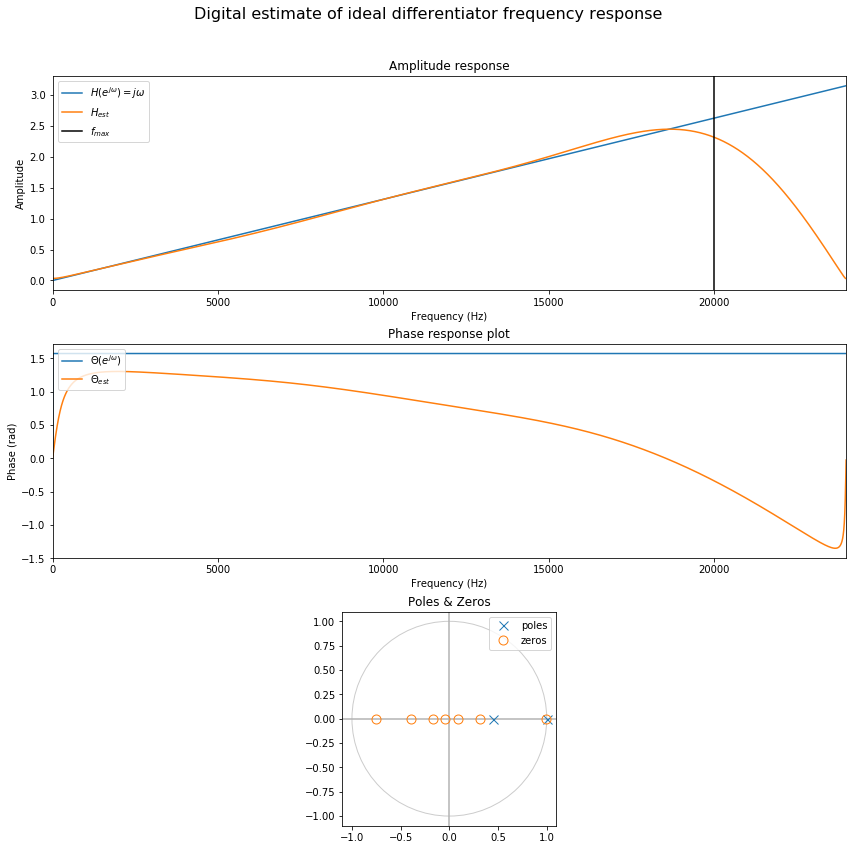

In [6]:
_ = plot_digital_ideal_differentiator_est(num_zeros=6, num_poles=1, minumum_phase=True)

### Extracting Parametric Resonators from a Nonparametric Impulse Response

In [7]:
from scipy.io.wavfile import read as readwav
from IPython.display import Audio

fs, samples = readwav('classical_guitar_ir_16b.wav')
samples = samples / samples.max() # normalize to [-1, 1]
Audio(samples, rate=fs)

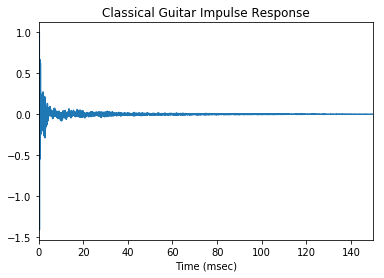

In [8]:
# Bought from https://www.3sigmaaudio.com/items/category/classical-guitars/ - Taylor 812ce
t_ms = (np.arange(samples.size) / fs) * 1000
plt.plot(t_ms, samples)
plt.xlim(0, t_ms[-1])
plt.title('Classical Guitar Impulse Response')
_ = plt.xlabel('Time (msec)')

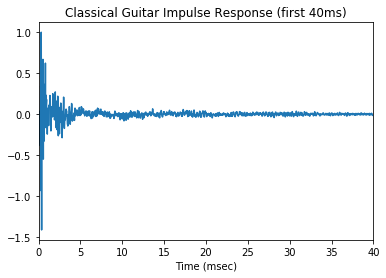

In [9]:
plt.plot(t_ms, samples)
plt.xlim(0, 40)
plt.title('Classical Guitar Impulse Response (first 40ms)')
_ = plt.xlabel('Time (msec)')

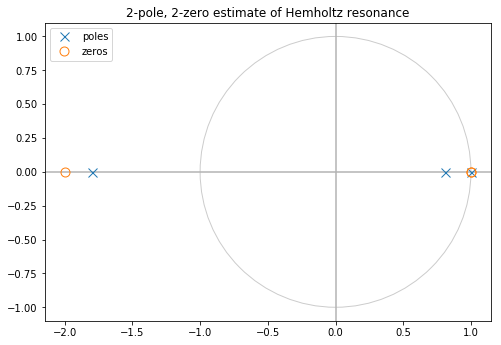

In [10]:
from scipy.signal import lfilter

S = np.fft.rfft(samples)
w = np.arange(S.size) * 2 * np.pi / samples.size
freq = w * fs / (2 * np.pi)

hemholtz_freq_hz = 100.98 # TODO find first peak with peak estimation
# In the book, bw is 10, but it seems way too narrow - expanding for illustration purposes
# Also, it will be different for different guitars. Ideally we'd actually estimate this from time-frequency data.
hemholtz_bandwidth_hz = 20

R = np.exp(-np.pi * hemholtz_bandwidth_hz / fs)
z = R * np.exp(1j * 2 * np.pi * hemholtz_freq_hz / fs)
b_hemholtz_inv = [1, -(z + np.conj(z)), z * np.conj(z)]
a_hemholtz_inv = b_hemholtz_inv * 0.9**np.arange(len(b_hemholtz_inv))

zplane(b_hemholtz_inv, a_hemholtz_inv)
_ = plt.title('2-pole, 2-zero estimate of Hemholtz resonance')

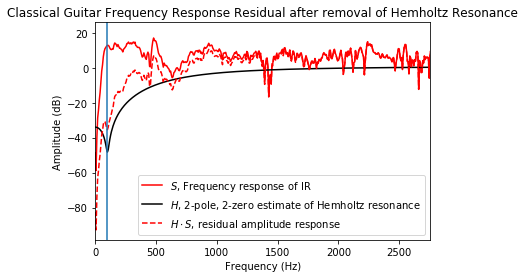

In [11]:
hem_w_index = int(hemholtz_freq_hz * samples.size / fs)
# invfreqz_mask = np.zeros(S.size)
# invfreqz_mask[hem_w_index - 5:hem_w_index + 5] = 1.0
# b_hemholtz, a_hemholtz = invfreqz(h=S, w=w, nb=2, na=2, wt=invfreqz_mask)
# w, H_hemholtz = freqz(a_hemholtz, b_hemholtz, S.size)

w, H_hemholtz = freqz(b_hemholtz_inv, a_hemholtz_inv, S.size)

magnitude = lambda H: 20 * np.log10(np.abs(H))

plt.plot(freq, magnitude(S), c='r', label='$S$, Frequency response of IR')
plt.plot(freq, magnitude(H_hemholtz), c='black', label='$H$, 2-pole, 2-zero estimate of Hemholtz resonance')
plt.plot(freq, magnitude(S * H_hemholtz), c='r', linestyle='--', label='$H \cdot S$, residual amplitude response')
plt.axvline(freq[hem_w_index])
#plt.axvspan(freq[hem_w_index - 4], freq[hem_w_index + 4], alpha=0.5, color='blue')
plt.xlim(freq[0], freq[freq.size // 8])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude (dB)')
plt.title('Classical Guitar Frequency Response Residual after removal of Hemholtz Resonance')
_ = plt.legend()

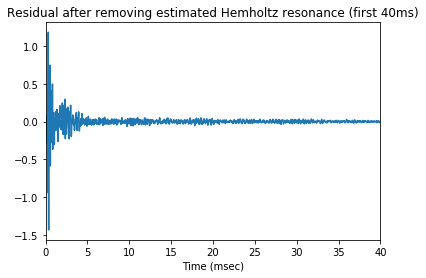

In [12]:
residual = lfilter(b_hemholtz_inv, a_hemholtz_inv, samples)
plt.plot(t_ms, residual.real)
plt.xlim(0, 40)
plt.title('Residual after removing estimated Hemholtz resonance (first 40ms)')
_ = plt.xlabel('Time (msec)')

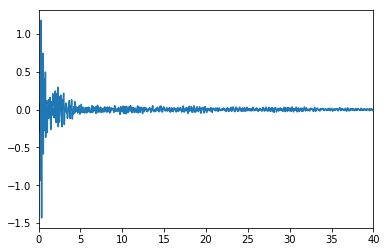

In [13]:
# Sanity check - IDFT should be the same (to round-off error) as the above inverse-filtering
residual_2 = np.fft.irfft(S * H_hemholtz)
plt.plot(t_ms, residual_2)
_ = plt.xlim(0, 40)
assert(np.abs(residual_2 - residual).mean() < 1e-4)

## Virtual Analog Example: Phasing

### [Phasing with 2nd-Order Allpass Filters](https://ccrma.stanford.edu/~jos/pasp/Phasing_2nd_Order_Allpass_Filters.html)

![](https://ccrma.stanford.edu/~jos/pasp/img1951.png)

The allpass structure diagrammed above can be used to generate nonuniformly spaced notches that are independently controllable. An advantage of the allpass approach even in the case of uniformly spaced notches (flanging) is that no interpolating delay line is needed. 

In [14]:
def make_allpass(pole_radius, pole_angle):
    a_1 = -2 * pole_radius * np.cos(pole_angle)
    a_2 = pole_radius ** 2
    return [a_2, a_1, 1], [1, a_1, a_2]

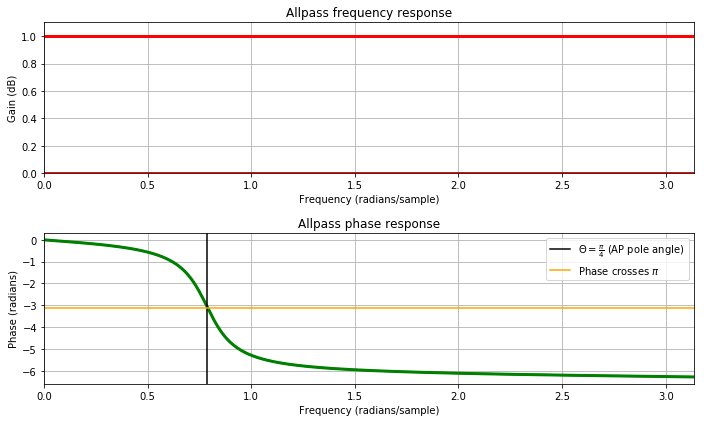

In [15]:
from PlotUtils import plot_frequency_response

pole_angle_1 = np.pi / 4
b_1, a_1 = make_allpass(0.9, pole_angle_1)
w, H = freqz(b_1, a_1)
fig, [frequency_plot, phase_plot] = plot_frequency_response(w, H)
frequency_plot.plot(w, np.abs(H), c='r', linewidth=3)
frequency_plot.set_ylim(0, 1.1)
frequency_plot.set_title('Allpass frequency response')
phase_plot.plot(w, np.unwrap(np.angle(H)), c='g', linewidth=3)
phase_plot.axvline(np.pi / 4, c='black', label='$\\Theta = \\frac{\\pi}{4}$ (AP pole angle)')
phase_plot.axhline(-np.pi, c='orange', label='Phase crosses $\\pi$')
phase_plot.set_title('Allpass phase response')
_ = phase_plot.legend()

In [16]:
# Run the given `x` signal through a serial chain of filters
# Expects `filters` to be a Nx2-array of [b, a] transfer function coefficients
# Mixes the original signal with gain `g`
# `x` defaults to an impulse response.
def chain_filters(filters, g=1.0, x=np.concatenate([[1.0], np.zeros(255)])):
    y = x
    for f in filters:
        b, a = f
        y = lfilter(b, a, y)
    return y + x * g

In [17]:
sys.path.append('../')
from ipython_animation import create_animation, DEFAULT_FPS

audio_fs, audio_samples = readwav('speech-male.wav')

def animate_allpass_phaser(length_seconds=audio_samples.size / audio_fs):
    poles = [[0.9, np.pi / 5], [0.9, np.pi / 2], [0.9, 3 * np.pi / 5], [0.9, 5 * np.pi / 6]]

    fig = plt.figure(figsize=(12,10))
    grid = (3, 4)
    freq_plot = plt.subplot2grid(grid, (0, 0), colspan=grid[1])
    phase_plot = plt.subplot2grid(grid, (1, 0), colspan=grid[1])
    pz_plots = [plt.subplot2grid(grid, (grid[0] - 1, column)) for column in range(grid[1])]

    num_frames = int(DEFAULT_FPS * length_seconds)
    seconds_per_frame = 1 / DEFAULT_FPS
    samples_per_frame = int(audio_fs * seconds_per_frame)
    phased_samples = np.zeros(samples_per_frame * num_frames)

    def animate(frame):
        completion = frame / (num_frames - 1)
        for i, pole in enumerate(poles):
            inc_amount = np.pi / num_frames
            if i % 2 == 0: # notches travelling in opposite directions
                inc_amount = -inc_amount
            pole[1] += inc_amount
            pole[1] %= np.pi # wrap around
        allpasses = [make_allpass(*pole) for pole in poles]

        audio_frame_begin = frame * samples_per_frame
        audio_frame_end = audio_frame_begin + samples_per_frame
        early_samples = 0 if audio_frame_begin == 0 else 8
        audio_frame = audio_samples[audio_frame_begin - early_samples:min(audio_frame_end, audio_samples.size - 1)]
        phased_samples[audio_frame_begin:audio_frame_end] = chain_filters(allpasses, x=audio_frame)[early_samples:]
        
        y_impulse = chain_filters(allpasses) # input signal defaults to impulse response
        w, H = np.linspace(0, np.pi, y_impulse.size // 2 + 1), np.fft.rfft(y_impulse)

        freq_plot.cla()
        phase_plot.cla()
        for pz_plot in pz_plots:
            pz_plot.cla()

        plot_frequency_response(w, H, frequency_plot=freq_plot, phase_plot=phase_plot)
        freq_plot.set_ylim(-20, 10)
        freq_plot.set_title('Allpass-chain phaser frequency response')

        phase_plot.set_ylim(-2 * np.pi, 2 * np.pi)
        phase_plot.set_title('Allpass-chain phaser phase response')

        for i, pole in enumerate(poles):
            pole_radius, pole_angle = pole
            freq_plot.axvline(pole_angle, c='black', label='Pole angles $\\Theta_n$' if i == 0 else '')
            phase_plot.axvline(pole_angle, c='black', label='Pole angles $\\Theta_n$' if i == 0 else '')
            pole_complex = pole_radius * np.exp(1j * pole_angle)
            zplane([1 / pole_complex, 1 / np.conj(pole_complex)], [pole_complex, np.conj(pole_complex)],
                   ax=pz_plots[i], fig=fig)
            pz_plots[i].set_xlim(-1.5, 1.5)
            pz_plots[i].set_ylim(-1.5, 1.5)
            if i is not 0:
                pz_plots[i].get_legend().remove()
                freq_plot.legend(loc='upper right')
                phase_plot.legend(loc='upper right')
        plt.tight_layout()

    return create_animation(fig, plt, animate, length_seconds=length_seconds), phased_samples

In [18]:
animation, phased_samples = animate_allpass_phaser()
animation

In [19]:
Audio(phased_samples, rate=audio_fs) # dealing with the zipper noise for this demo